#0.&nbsp; Imports und Helper

In [ ]:
!pip install datasets

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 542.0/542.0 kB 4.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 9.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 7.7 MB/s eta 0:00:00


In [1]:
import torch
import numpy as np
from torch import nn
from math import pi, e
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from scipy.interpolate import griddata
import plotly.graph_objects as go
from sklearn.datasets import load_iris, load_breast_cancer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import torch.nn.functional as F
from torch.autograd import Variable
import tqdm
import torch.nn.init as init



#1.&nbsp;Gradient Implementieren

## Analytisch


Gegeben sei die folgende Funktion:

\begin{equation}
h(a, b) = 3\cdot(1-a)^2-b^2
\end{equation}

Bestimmen Sie den Gradientenvektor unter Verwendung von Schulmathematik (Ableitungsregeln):

\begin{equation}
  \begin{bmatrix}
  \dfrac{\partial f}{\partial a} ,\dfrac{\partial f}{\partial b}
  \end{bmatrix}
\end{equation}



**Kettenregel**: Für eine zusammengesetzte Funktion gilt $h(x) = f(g(x)) \equiv (f \circ g)(x)$:

\begin{equation}
f'(x) = g'(h(x)) \cdot h'(x)
\end{equation}

oder:

\begin{equation}
\frac{\partial f(g(x))}{\partial x} = \frac{\partial f(g(x))}{\partial g(x)} ~ \frac{\partial g(x)}{\partial x}
\end{equation}


##Programmatisch



*   Implementieren Sie Pythonfunktionen, die Ihnen jeweils die Funktionswerte und die Werte der partiellen Ableitungen liefern.
* Nutzen Sie die vorgegebene Codestruktur, um zunächst die Funktionswerte als 3d-Oberflächenplot zu visualisieren
*   Fügen Sie weiterhin einen beliebigen Startpunkt zu Visualisierung hinzu und weiterhin die nächste Position nach Durchführung eines Schrittes im Gradientenabstieg. Sieht das Ergebnis visuell plausibel aus?
* Experimentieren Sie mit der Lernrate und dem Ergebnis z.B. nach mehreren Iterationen



In [ ]:
#Beispiel-Visualierung einer beliebigen Funktion
smallestpoint = -3
largestpoint = 3
stepsize = 0.01


x, y = np.mgrid[smallestpoint:largestpoint:stepsize, smallestpoint:largestpoint:stepsize]

fig = go.Figure([
    go.Surface(x=x, y=y, z=x*y)
])

#diese Werte ergeben keinen besonderen Sinn, nur zu Demonstrationszwecken
fig.add_trace(
    go.Scatter3d(x=[1,2],
                 y=[1,2],
                 z=[3,4],
                 mode='markers')
)

fig

## PyTorch Autograd

Zeigen bzw. überprüfen Sie mit Hilfe der in PyTorch vorhandenen autograd Funktionalität (z.B. https://pytorch.org/tutorials/beginner/blitz/autograd_tutorial.html die Korrektheit Ihrer oben "zu Fuß" implementiert berechneten Ergebnisse. Greifen Sie ggf. auch auf die separat referenzierten und Tutorials zurück.

In [ ]:
#Ihr Code hier

#2.&nbsp;Simples MLP From Scratch Implementieren


## Datenvorverarbeitung

In [53]:
iris = load_iris() #@param ["load_iris()", "load_breast_cancer()"] {type:"raw"}
X = iris['data']
y = iris['target']
names = iris['target_names']
feature_names = iris['feature_names']

# Scale data to have mean 0 and variance 1
# which is importance for convergence of the neural network
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_train_np, X_test_np, y_train_np, y_test_np = train_test_split(
    X_scaled, y, test_size=0.2, random_state=2)

## Eigenimplementierung

Implementieren Sie ein vollständiges Multilayer Perzeptron mit folgender Spezifikation OHNE die Nutzung einer speziellen NN-Library; mathematische Bibliotheken sind erlaubt:

* Input Layer: 4 Neuronen
* Hidden Layer: 5 Neuronen (plus jeweils Bias), Gewichte mit 0.5 initialisiert
* Output Layer: 3 Neuronen (plus jeweils Bias)
* Epochen: 100
* Lernrate: 0.5
* Activation Function: sigmoid; Bonus: es sollen jedoch auch Tangens Hyperbolicus und RELU möglich sein
* Loss Function: Squared Euclidean Distance

Testen Sie Ihr neuronales Netz auf den gegebenen IRIS-Daten. Stellen Sie sicher, dass Ihre Ausgaben möglichst genau so berechnet werden wie in der PyTorch Referenz in Aufgabe 3



In [63]:
#Ihr Code hier
np.random.seed(11)

class MLP():

  def initialize_weights(self, W_shape: tuple, val=0.5):
    nrows, ncols = W_shape
    weights = np.array([[val for i in range(ncols)]]*nrows, dtype=np.float32)
    return weights

  def __init__(self, x_dim: np.array):
        self.hidden_W = self.initialize_weights((x_dim, 5)) # 5 Neurons in hidden layer
        # self.hidden_bias = np.random.rand(5)
        self.hidden_bias = np.array([0.5]*5, dtype=np.float32)
        self.output_W = self.initialize_weights((5, 3)) # 3 output layer Neurons
        # self.output_bias = np.random.rand(3)
        self.output_bias = np.array([0.5]*3, dtype=np.float32)


  def sigmoid(self, x):
    return 1 / (1 + np.exp(-x))

  def softmax(self, x):
    exp_x = np.exp(x - np.max(x, axis=1, keepdims=True))  # Subtracting the maximum for numerical stability
    return exp_x / np.sum(exp_x, axis=1, keepdims=True)

  def forward(self, x):
    x = np.array(x, dtype=np.float32)
    self.x = x
    layer_1 = np.matmul(x, self.hidden_W, casting="no") + self.hidden_bias
    sigmoid_1 = self.sigmoid(layer_1)
    self.output_l1 = sigmoid_1
    layer_2 = np.matmul(sigmoid_1, self.output_W, casting="no") + self.output_bias
    output =  self.sigmoid(layer_2)
    self.output_l2 = output
    return output

  def loss(self, y, y_pred):
    self.y_pred = y_pred
    self.y = y
    loss = np.mean((y - y_pred)**2, dtype=np.float32)
    return loss

  def backward(self):
    # 1/N(sum (y - yhat)²)
    # 2/N *(sum (y - yhat)²)
    n = self.y.shape[1]
    J_y_hat = (-2/n)*(self.y - self.y_pred)
    J_u2 = J_y_hat*(self.output_l2*(1 - self.output_l2)) # hadamard product of derivate dJ / d_y_hat and derivative of sigmoid function
    self.output_W_gradients = np.matmul(self.output_l1.T, J_u2, casting="no")
    # print("Output_W_Gradients:")
    # print(self.output_W_gradients)
    self.output_bias_gradients = J_u2
    # print("Output_Bias_Gradients:")
    # print(self.output_bias_gradients)
    J_v1 = np.matmul(J_u2, self.output_W.T, casting="no")
    J_u1 = np.multiply(J_v1, (self.output_l1*(1 - self.output_l1)))
    self.hidden_W_gradients = np.matmul(self.x.T, J_u1, casting="no")
    # print("Hidden W gradients")
    # print(self.hidden_W_gradients)
    self.hidden_bias_gradients = J_u1
    # print("hidden_bias_gradients:")
    # print(self.hidden_bias_gradients)


  def optimize(self,lr):
    # print("\n")
    # print("updates params:")
    self.hidden_W = self.hidden_W - lr*self.hidden_W_gradients
    self.hidden_bias = self.hidden_bias - lr*self.hidden_bias_gradients
    self.output_W = self.output_W - lr*self.output_W_gradients
    self.output_bias = self.output_bias - lr*self.output_bias_gradients
    # print(self.hidden_W.T)
    # print(self.hidden_bias)
    # print(self.output_W.T)
    # print(self.output_bias)


mlp = MLP(x_dim=X_train_np.shape[1])
n_epochs = 100
lr = 0.5
train_losses = []
test_losses = []
test_accuracy = []
train_loss_epoch = 0
y_ohe = np.eye(3, dtype=np.float32)[y_train_np]
y_test_ohe = np.eye(3)[y_test_np]


# output = mlp.forward(X_train_np[:1])
# train_loss = mlp.loss(y_ohe[:1], output)
# train_loss_epoch += train_loss
# mlp.backward()
# mlp.optimize(lr)

for epoch in range(n_epochs):
  for j in range(len(X_train_np)):
    output = mlp.forward(X_train_np[j:j+1])
    train_loss = mlp.loss(y_ohe[j:j+1], output)
    train_loss_epoch += train_loss
    mlp.backward()
    mlp.optimize(lr)
    
  train_losses.append(train_loss_epoch / len(X_train_np))
  train_loss_epoch = 0

  output_test = mlp.forward(X_test_np)
  y_pred = np.eye(3)[output_test.argmax(axis=1)]
  # test_loss = mlp.loss(y_test_ohe, y_pred)
  # test_losses.append(test_loss)
  test_accuracy.append(np.mean(y_pred == y_test_ohe))

Things that weng wrong:


*   Hardmax instead of softmax for calculating the loss
*   Derivative of y^ was wrong
*   precision of numpy at 64- instead 32-bit



#3.&nbsp;Pytorch MLP auf echten Daten testen
adaptiert von: https://janakiev.com/blog/pytorch-iris/

Machen Sie sich noch einmal die Unterschiede von dem gegebenen PyTorch Code zu Ihrem eigenen klar.

Testen Sie zunächst isoliert und dann ggf. in Kombination den Effekt folgender Veränderungen am gegebenen PyTorch neuronalen Netz:

*   Austauschs des Squared Euclidean Distance Losses durch Cross Entropy Loss
*   Austausch des Optimizer-Verfahrens von SGD zu ADAM
*   zufällige Initialisierung der Gewichte statt konstant 0.5 (einfach die Initialisierungsfunktion auskommentieren
*   Veränderung der Lernrate
*   Veränderung der Anzahl Neuronen im Hidden Layer
*   Hinzufügen eines zusätzlichen Layers


Achten Sie auf:

*   Konvergenzverhalten: wie früh und wie "stabil" konvergiert die Vorhersagegüte?
*   Vorhersagegüte: Welche Modellperformance kann erreicht werden?






***...Ihre Interpretation und Dokumentation hier...***

## Modellexperimente

In [52]:
X_test_np.dtype

dtype('float64')

In [48]:
y_test

tensor([0, 0, 2, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 1, 1, 0, 1, 2, 1, 1, 1, 2, 1,
        1, 0, 0, 2, 0, 2])

In [47]:
X_test

tensor([[-1.50652051,  0.78880757, -1.34022653, -1.18381214],
        [-1.50652051,  0.09821729, -1.28338909, -1.31544435],
        [-0.17367394, -1.28296328,  0.70592082,  1.05393505],
        [-1.26418483, -0.13197948, -1.34022653, -1.44707644],
        [-1.26418483,  0.78880757, -1.05603933, -1.31544435],
        [ 1.64384413, -0.13197948,  1.16062021,  0.52740628],
        [-1.02184904, -0.13197948, -1.22655165, -1.31544435],
        [ 1.03800476, -1.28296328,  1.16062021,  0.79067063],
        [ 0.67450112, -0.59237301,  1.04694545,  1.18556726],
        [-1.26418483, -0.13197948, -1.34022653, -1.18381214],
        [-0.65834540,  1.47939789, -1.28338909, -1.31544435],
        [-1.74885631,  0.32841405, -1.39706397, -1.31544435],
        [-1.02184904,  0.32841405, -1.45390141, -1.31544435],
        [-0.53717756,  1.93979144, -1.16971421, -1.05217993],
        [ 0.18982966,  0.78880757,  0.42173371,  0.52740628],
        [ 0.79566902, -0.59237301,  0.47857115,  0.39577410],
        

  0%|          | 0/100 [00:00<?, ?it/s]

100%|██████████| 100/100 [00:07<00:00, 14.16it/s]


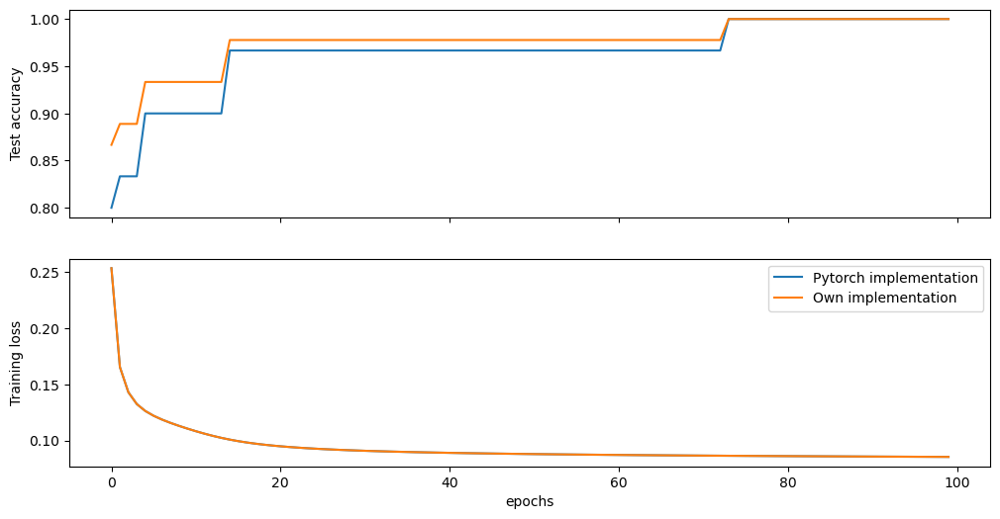

In [57]:
X_train = Variable(torch.from_numpy(X_train_np)).float()
y_train = Variable(torch.from_numpy(y_train_np)).long()
X_test  = Variable(torch.from_numpy(X_test_np)).float()
y_test  = Variable(torch.from_numpy(y_test_np)).long()

torch.set_printoptions(precision=8)

EPOCHS  = 100 #@param {type:"slider", min:1, max:1000, step:1}
RATE = 0.5 #@param {type:"slider", min:0.001, max:1, step:0.001}
HIDDENNEURONS = 5 #@param {type:"slider", min:2, max:200, step:1}
class Model(nn.Module):
    def __init__(self, input_dim):
        super(Model, self).__init__()
        self.layer1 = nn.Linear(input_dim, HIDDENNEURONS)
        #self.layer2 = nn.Linear(HIDDENNEURONS, HIDDENNEURONS)
        self.layer3 = nn.Linear(HIDDENNEURONS, 3)

    def forward(self, x):
        x = F.sigmoid(self.layer1(x))
        self.l1=x
        #x = F.sigmoid(self.layer2(x))
        x = self.layer3(x)
        x = F.sigmoid(x)
        self.l2=x
        return x

    def init_weights(self):
    # Initialize weights to a constant value, e.g., 0.5
        for m in self.modules():
            if isinstance(m, nn.Linear):
                init.constant_(m.weight, 0.5)
                # Optionally initialize biases as well, e.g., to 0
                if m.bias is not None:
                    init.constant_(m.bias, 0.5)
model     = Model(X_train.shape[1])
model.init_weights()

#for param in model.parameters():
#  print(param.data)

#optimizer = torch.optim.Adam(model.parameters(), lr=RATE)
optimizer = torch.optim.SGD(model.parameters(), lr=RATE)

#loss_fn   = nn.CrossEntropyLoss()
loss_fn   = nn.MSELoss(reduction="mean")


loss_list     = np.zeros((EPOCHS,))
accuracy_list = np.zeros((EPOCHS,))


for epoch in tqdm.trange(EPOCHS):

    loss_epoch = 0
    for subset in range(len(X_train)):#range(1):#range(len(X_train)):
        y_pred = model(X_train[subset])
        loss = loss_fn(y_pred,F.one_hot(y_train[subset], num_classes = 3).float())

        # Zero gradients
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        loss_epoch += loss.item()

        #for param in model.parameters():
        #    print(param)
        #    print(param.grad)
    loss_list[epoch] = loss_epoch / len(X_train)
    with torch.no_grad():
        y_pred = model(X_test)
        correct = (torch.argmax(y_pred, dim=1) == y_test).type(torch.FloatTensor)
        accuracy_list[epoch] = correct.mean()



fig, (ax1, ax2) = plt.subplots(2, figsize=(12, 6), sharex=True)

ax1.plot(accuracy_list, label="Pytorch implementation")
ax1.plot(test_accuracy, label="own implementation")
ax1.set_ylabel("Test accuracy")
ax2.plot(loss_list, label="Pytorch implementation")
ax2.plot(train_losses, label="Own implementation")
ax2.set_ylabel("Training loss")
ax2.set_xlabel("epochs")
plt.legend()

In [61]:
torch.argmax(y_pred, dim=1)

tensor([0, 0, 2, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 1, 1, 0, 1, 2, 1, 1, 1, 2, 1,
        1, 0, 0, 2, 0, 2])